In [1]:
# Import libraries

import xarray as xr
import numpy as np
import seaborn as sns
#import gcm_filters
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from mpl_toolkits.mplot3d import Axes3D
from scipy.ndimage import gaussian_filter
from mpl_toolkits.basemap import Basemap, cm, shiftgrid
from matplotlib.colors import ListedColormap

import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Notebook for retrieving the 1/4 degree clusters/dynamical regimes

The notebook is tied to the NEMI methodology as described here:
Sonnewald, M., in review. A hierarchical ensemble manifold methodology for new knowledge on spatial data: An application to ocean physics. Journal of Advances in Modeling Earth Systems.

We go through the routines briefly below.

Purpose of notebook: To allow the retrieval of the dynamical regimes for a desired 'aggregation' of clusters.

A low number of clusters means that more of the ocean is assembled within a smaller number of clusters, so the area covered by the individual clusters will on the whole be larger. 

For a lower cluster number, we see familiar patterns also seen in:
Sonnewald, M., Wunsch, C. and Heimbach, P. Unsupervised Learning Reveals Geography of Global Ocean Dynamical Regions, 2019, Journal of Earth and Space Science

Work to examine the larger number of clusters is ongoing.



In [2]:
#NB: This plotting routine SUBSAMPLES (only takes a bit of the data) as it's otherwise very slow. 
#If the rate is too high things will look low resolution 

def makeFig_global(data,cMin, cMax, cStep, title, saveName):
    ''' Routine to plot global clusters '''
    subSample=1
    fig = plt.figure(figsize=(10,10))
    map2 = Basemap(lon_0=0, projection='robin', resolution='l')
    map2.drawmapboundary(fill_color='0.9')
    map2.fillcontinents(color='#ddaa66', lake_color='#7777ff', zorder=0)
    map2.drawcoastlines()
    map2.fillcontinents()
    map2.drawcountries()
    map2.drawparallels(np.arange(-90.,99.,20.),labels=[1,1,0,1], fontsize=15)
    map2.drawmeridians(np.arange(-180.,180.,40.),labels=[1,1,0,1], fontsize=15)
    lons = np.array(lon[1,:])
    lats = np.array(lat[:,100])
    llons, llats = np.meshgrid(lons,lats)
    im2=map2.contourf(llons[1::subSample, 1::subSample],llats[1::subSample, 1::subSample],data[1::subSample, 1::subSample],np.arange(cMin, cMax, cStep),cmap=my_cmap,shading='flat',latlon=True)
    plt.title(title, fontsize=20)
    display(plt.gca().get_ylim())
   
    cb = map2.colorbar(im2,"right", size="2%", pad="15%")
    cb.ax.tick_params(labelsize=20) 
    plt.savefig(saveName, format='png', dpi=100, bbox_inches='tight')

def makeFigZoomBathymetry(data,cMin, cMax, cStep, title, saveName, llcrnrlon=-65, urcrnrlon=-20, llcrnrlat=35, urcrnrlat=65):
    subSample=1
    fig = plt.figure(figsize=(10,10))
    map2 = Basemap(llcrnrlon,llcrnrlat,urcrnrlon,urcrnrlat, lon_0=-90, projection='merc', resolution='l')
    map2.drawmapboundary(fill_color='0.9')
    map2.fillcontinents(color='#ddaa66', lake_color='#7777ff', zorder=0)
    map2.drawcoastlines()
    map2.fillcontinents()
    map2.drawcountries()
    map2.drawparallels(np.arange(-90.,99.,5.),labels=[1,1,0,1], fontsize=15)
    map2.drawmeridians(np.arange(-180.,180.,20.),labels=[1,1,0,1], fontsize=15)
    lons = np.array(lon[1,:])
    lats = np.array(lat[:,100])
    llons, llats = np.meshgrid(lons,lats)
    im2=map2.contourf(llons[1::subSample, 1::subSample],llats[1::subSample, 1::subSample],data[1::subSample, 1::subSample],np.arange(cMin, cMax, cStep),cmap=my_cmap,shading='flat',latlon=True)
    plt.title(title, fontsize=20)
    display(plt.gca().get_ylim())
    #cb = map2.colorbar(im2,"right", size="5%", pad="9%")
    cb = map2.colorbar(im2,"right", size="7%", pad="1%")
    cb.ax.tick_params(labelsize=20) 
    plt.savefig(saveName, format='png', dpi=100, bbox_inches='tight')
 

In [3]:
def sortClusters(data, nrC):
    labels = data
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    labeled=np.sum(labels>0)
    x = labels+1
    y = np.bincount(x)
    ii = np.nonzero(y)[0]
    xx=np.vstack((ii,y[ii])).T
    yy= xx[xx[:, 1].argsort()] #Sort by how many points there are
    perc = np.zeros((yy.shape[0], yy.shape[1]+1))
    perc[:,0:2]=yy[:,:]
    perc[:,2]=(yy[:,1]*100)/np.nansum(yy[:,1])
    
    try:
        if (np.flipud(perc[:,2])<3).shape[0] < 2:
            clusterPlacing=0
        else:
            clusterPlacing=np.where(np.flipud(perc[:,2])<3)[0][0]
    except:
        clusterPlacing=0
    stats= (clusterPlacing-2, n_clusters_, (float(labeled)/labels.shape[0])*100)
    
    newLabels=np.zeros(data.shape)*np.nan
    LABEL=1
    #print(LABEL)
    if nrC<20: 
        nrC_use=nrC
    else: 
        nrC_use=30
    for NR in np.arange(1, int(nrC_use)):
        inds=np.where(data==perc[-NR,0]-1)
        #print(perc[-NR,0], np.array(inds).shape)
        newLabels[inds]=LABEL
        #print(LABEL, len(inds[0]))
        LABEL+=1

    return newLabels

In [4]:
arr_list = []
mylen = np.vectorize(len)

def retLabels(file, NR_clusters, sizeOfDataset):
    """Routine to return the cluster dataset sorted by the "sortClusters" 
    routine. If the data is not found the flag "Could not find file" is used."""
    nr=file[21:mylen(file)-4]
    try:
        OutP = np.load('/archive/Maike.Sonnewald/MOM6/agglomerateClustering/'+file)
        labelsRet=sortClusters(OutP, NR_clusters)
    except FileNotFoundError:
            #print("Could not find file.")
            labelsRet=np.zeros(sizeOfDataset)*np.nan
    return labelsRet

In [5]:
def AsessClusterOverlap_voted(base, L,  NR_considered, cut):
    """ Routine to assess what clusters overlap. Here a global vote is 
    implemented for each gridbox as determined by the overlap between the global 
    clusters to assess potential cluster candidates. 
    
    The inputs are the 'base' as assumed randomly. Doesn't really matter which 
    ensemble member hugely. L is the list of the ensemble members. NR_considered 
    is the number of clusters we're looking for. Cut is the number were choosing 
    from the agglomerative clustering. """
    #Make dummy for output
    nrOfDatasets=len(L)
    sortedOverlap=np.zeros((nrOfDatasets+1,NR_considered+1,base.shape[0]))*np.nan
    
    clustersCompared=NR_considered
    summaryStats=np.zeros((clustersCompared+2,clustersCompared))
    dataVector=L
    for dataSet in np.arange(nrOfDatasets):
        DataToCompare= dataVector[dataSet]
        clusterIndex=0

        for c1 in np.arange(1, clustersCompared+1): #Go through each cluster
            data1_M = np.zeros(base.shape, dtype=int)
            data1_M[np.where(c1==base)]=1 #Mark where the considered cluster is in the data that is being used as the baseline

            summaryStats[0,clusterIndex]=np.sum(data1_M) # Count numer of entries [Why?] 

            ## Move on to the next dataset that is to be compared to the first
            k = 0
            for c2 in np.arange(1, clustersCompared+1):
                data2_M = np.zeros(base.shape, dtype=int)  #Make dummy
                data2_M[np.where(c2==DataToCompare)]=1              #Make dataset indicating where geographically the considered cluster is located

                num_overlap=np.sum(data1_M*data2_M)       #Sum of flags where the two datasets of that cluster are both present
                num_total=np.sum(data1_M | data2_M)       #Sum of where they overlap
                k = max(k, num_overlap / num_total)       #Collect the number that is largest of k and the num_overlap/num_total
                summaryStats[c2,clusterIndex]=(num_overlap / num_total)*100 #Add percentage of coverage
            clusterIndex+=1
            #Filled in 'summaryStatistics' matrix results of percentage overlaps

        usedClusters = set() # Used to mak sure clusters don't get selected twice
        #Clusters are already sorted by size
        
        sortedOverlapForOneCluster=np.zeros(base.shape, dtype=int)*np.nan
        for c1 in np.arange(1, clustersCompared+1):            # Go through clusters from biggest to smallest
            sortedOverlapForOneCluster=np.zeros(base.shape, dtype=int)*np.nan
            #print('cluster number ', c1, summaryStats.shape, summaryStats[1:,c1-1].shape)

            # find biggest cluster in first column, making sure it has not been used
            sortedClusters = np.argsort(summaryStats[1:,c1-1])[::-1] + 1
            biggestCluster = [ele for ele in sortedClusters if ele not in usedClusters][0]

            # record it for later
            usedClusters.add(biggestCluster)

            data2_M = np.zeros(base.shape, dtype=int) # Make dummy
            data2_M[np.where(biggestCluster==DataToCompare)]=1 # Select cluster being assessed

            sortedOverlapForOneCluster[np.where(data2_M==1)]=1
            sortedOverlap[dataSet, c1, :]=sortedOverlapForOneCluster
        #print(dataSet, c1)

    return sortedOverlap
    

In [6]:
def makeBarChart(Area, indexes, tauB, tauS, cori, bpt, A, B, 
                                                   saveName, title,ax=None, **kwargs):
    """ Routine to make par charts from the BV data """
    
    #print('indexing')

    areaS = np.nansum(Area[indexes]) 
    curlTauB_box=np.nansum(tauB[indexes]*Area[indexes])/areaS
    curlTauS_box=np.nansum(tauS[indexes]*Area[indexes])/areaS
    curlCori_box=np.nansum(cori[indexes]*Area[indexes])/areaS
    bpt_box=np.nansum(bpt[indexes]*Area[indexes])/areaS
    curlA_box=np.nansum(A[indexes]*Area[indexes])/areaS
    curlB_box=np.nansum(B[indexes]*Area[indexes])/areaS

    dataBars = np.asarray((curlTauB_box+curlTauS_box, curlCori_box, bpt_box, 
                           curlA_box, curlB_box))
    print(np.nansum(dataBars))
    mask1 = dataBars < 0
    mask2 = dataBars >= 0
    
    N = 5
    ind = np.arange(N) # the x locations for the groups
    width = 0.35       # the width of the bars
    print('plotting')
    fig,ax = plt.subplots()
    rects1 = plt.bar(ind[mask1], dataBars[mask1], width, color='b') 
    rects1 = plt.bar(ind[mask2], dataBars[mask2], width, color='r')
    ax.set_ylim(-5e-9, 5e-9)
    ax.set_title(title)
    labels=[r'', r'$\nabla \times \tau_{bs}$', r'$\nabla \cdot (f \mathrm{U})$',
            r'$\frac{1}{\rho_0}\nabla\times (p_b \times\mathrm{H})$', r'$\nabla \times \mathrm{A}$', 
            r'$\nabla \times \mathrm{B}$']

    ax.set_xticklabels( labels, rotation=-45 )




def plotBarchartReturnBars(data, cluster, numClusters, AX=None,AX2=None):
    ''' Return the data to be plotted. '''
    inds = np.where(data==cluster)
    field=np.zeros(data.shape)*np.nan
    field[inds]=cluster
    field_xr = xr.DataArray(data=np.flipud(field),
                            dims=['lat','lon'],
                            coords=dict(lat=col_height['lat'], lon=col_height['lon']),
                            name='Cluster')
    
    #makeFig_global(np.fliplr(np.rot90(field,2)), cluster,cluster+2,1,'', 'test.png')
    makeFig_global_new(field_xr, 1, '', cmap=ListedColormap(plt.get_cmap('tab20', numClusters).colors[cluster]))
    #makeFigZoomBathymetry(np.fliplr(np.rot90(field,2)), cluster-1,cluster+1,1,'', 'test.png',llcrnrlon=-80, 
    #                      urcrnrlon=10, llcrnrlat=10, urcrnrlat=70)

    overallArea=np.nansum(area*oceanMask)
    num_overlap=np.nansum((~np.isnan(np.flipud(field)))*(area*oceanMask))
  
    areaCluster = (num_overlap*100)/overallArea
    
    print('Area: ', areaCluster)
    if areaCluster<0.1: 
        print('Area too small')
        bars=0
        #continue
    elif areaCluster>0.1:
        makeBarChart(np.array(np.flipud(area*oceanMask)), inds, np.flipud(np.array(BPT_g['Curl_taub'])), 
                     np.flipud(np.array(BPT_g['Curl_taus'])), np.flipud(np.array(-BPT_g['beta_V'])), 
                     np.flipud(np.array(BPT_g['BPT'])), np.flipud(np.array(BPT_g['Curl_Adv'])), 
                     np.flipud(np.array(BPT_g['Curl_diff'])), 'test_{:02d}.png'.format(cluster), '', AX)
    #return AX_ret



In [7]:
# Load the data needed for e.g the BV, grid etc.

file_name = "test_an205_025101-025512.nc"
path1 = "/archive/Maike.Sonnewald/MOM6/"

ds1 = xr.open_dataset(path1 + file_name)

ds_grid=xr.open_dataset(
    '/archive/Raphael.Dussin/FMS2019.01.03_devgfdl_20221223/CM4_piControl_c192_OM4p25_v8/gfdl.ncrc4-intel18-prod-openmp/pp/ocean_monthly/ocean_monthly.static.nc')

ds_grid=ds_grid.isel(xq=np.arange(1,1441))
ds_grid=ds_grid.isel(yq=np.arange(1,1081))

lon=ds_grid['geolon']; lat=ds_grid['geolat']
area = ds_grid['areacello_bu']

BPT_g = xr.Dataset() # new xarray dataset for Gaussian-filtered fields. Using Hemant's naming

#list of the fields considered
fldlist = ['beta_V','BPT','Mass_flux','eta_dt','Curl_dudt','Curl_taus','Curl_taub','Curl_Adv','Curl_diff']
dims = ['yq', 'xq']

#NOTE only five terms used for UMAP: Outputdata = np.stack((forPairplot['BPT'],forPairplot['beta_V'],forPairplot['Curl_taub']+forPairplot['Curl_taus'],forPairplot['Curl_Adv'],forPairplot['Curl_diff']),axis=2)



#Run simple filter and area average
for fld in fldlist:
    tmp = gaussian_filter(ds1[fld] * area, sigma=1)
    BPT_g[fld] = (tmp/area).load().assign_coords({'geolat_c': ds_grid['geolat_c'], 'geolon_c': ds_grid['geolon_c']})
    
    
oceanMask=np.ones(BPT_g['BPT'].shape)
oceanMask[np.isnan(np.array(BPT_g['BPT']))]=np.nan

landMask=np.zeros(BPT_g['BPT'].shape)
landMask[np.isnan(np.array(BPT_g['BPT']))]=1
landInd = (landMask==0).flatten()

In [35]:
test = (BPT_g['BPT'] - (BPT_g['Curl_taus']+ BPT_g['Curl_taub']) + BPT_g['Curl_Adv'] + BPT_g['Curl_diff']).data

In [36]:
test2 = BPT_g['beta_V'].data

In [37]:
test = test[~np.isnan(test)]
test2 = test2[~np.isnan(test2)]

In [38]:
test

array([ 1.95353767e-08,  8.53634892e-09,  9.14000502e-09, ...,
       -7.80477560e-09, -1.28989868e-08, -9.30600945e-09])

In [39]:
test2

array([ 3.99155147e-10, -7.65394617e-10, -8.08462044e-10, ...,
       -1.17297256e-10, -3.27049251e-12,  2.74384255e-12])

In [14]:
curlTau = (BPT_g['Curl_taub'] + BPT_g['Curl_taus']).rename('Curl_tau')
curlTau

<xarray.DataArray 'Curl_tau' (yq: 1080, xq: 1440)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * xq        (xq) float64 -299.6 -299.3 -299.1 -298.9 ... 59.66 59.91 60.16
  * yq        (yq) float64 -80.35 -80.27 -80.19 -80.11 ... 89.78 89.89 90.0
    geolat_c  (yq, xq) float32 -79.77 -79.77 -79.77 -79.77 ... 64.28 64.17 64.06
    geolon_c  (yq, xq) float32 -299.6 -299.4 -299.1 -298.9 ... 60.0 60.0 60.0

In [17]:
BV = xr.merge([curlTau, BPT_g['beta_V'], BPT_g['BPT'], BPT_g['Curl_Adv'],  BPT_g['Curl_diff']])
BV

<xarray.Dataset>
Dimensions:    (xq: 1440, yq: 1080)
Coordinates:
  * xq         (xq) float64 -299.6 -299.3 -299.1 -298.9 ... 59.66 59.91 60.16
  * yq         (yq) float64 -80.35 -80.27 -80.19 -80.11 ... 89.78 89.89 90.0
    geolat_c   (yq, xq) float32 -79.77 -79.77 -79.77 ... 64.28 64.17 64.06
    geolon_c   (yq, xq) float32 -299.6 -299.4 -299.1 -298.9 ... 60.0 60.0 60.0
Data variables:
    Curl_tau   (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    beta_V     (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    BPT        (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    Curl_Adv   (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    Curl_diff  (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan

In [18]:
BV.rename({'xq':'lon','yq':'lat'}).drop(['geolat_c', 'geolon_c']).transpose('lat', 'lon').to_netcdf('Data_Step2/BV.nc')

In [10]:
BPT_g[['Curl_taub', 'Curl_taus']]

<xarray.Dataset>
Dimensions:    (yq: 1080, xq: 1440)
Coordinates:
  * xq         (xq) float64 -299.6 -299.3 -299.1 -298.9 ... 59.66 59.91 60.16
  * yq         (yq) float64 -80.35 -80.27 -80.19 -80.11 ... 89.78 89.89 90.0
    geolat_c   (yq, xq) float32 ...
    geolon_c   (yq, xq) float32 ...
Data variables:
    Curl_taub  (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    Curl_taus  (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan

In [24]:
BPT_g

<xarray.Dataset>
Dimensions:    (xq: 1440, yq: 1080)
Coordinates:
  * xq         (xq) float64 -299.6 -299.3 -299.1 -298.9 ... 59.66 59.91 60.16
  * yq         (yq) float64 -80.35 -80.27 -80.19 -80.11 ... 89.78 89.89 90.0
    geolat_c   (yq, xq) float32 ...
    geolon_c   (yq, xq) float32 ...
Data variables:
    beta_V     (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    BPT        (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    Mass_flux  (yq, xq) float32 nan nan nan nan nan nan ... nan nan nan nan nan
    eta_dt     (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    Curl_dudt  (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    Curl_taus  (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    Curl_taub  (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    Curl_Adv   (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    Curl_diff  (yq, xq) float64 nan nan nan nan nan nan ... nan nan nan nan nan

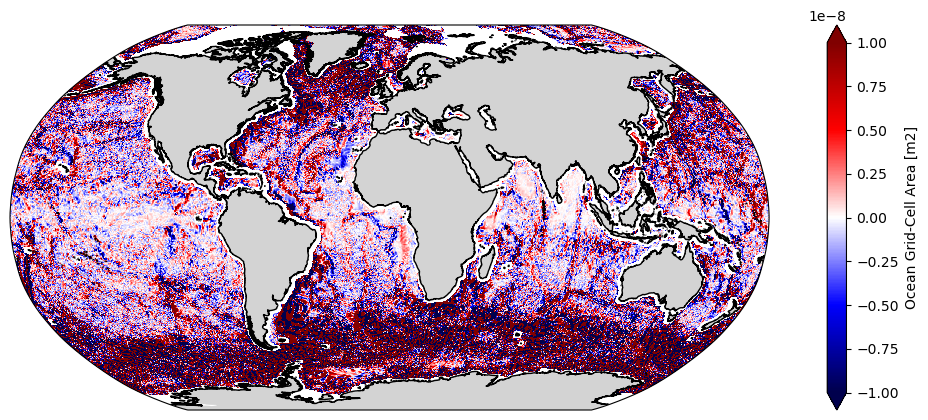

In [35]:
fig, axes = plt.subplots(1, 1, subplot_kw={'projection':ccrs.Robinson()}, figsize=(15,5))
BPT_g['BPT'].plot(ax=axes, transform=ccrs.PlateCarree(), cmap='seismic', vmin=-1e-8, vmax=1e-8)
axes.add_feature(cfeature.LAND, facecolor='lightgrey')
axes.coastlines(resolution='10m')
plt.show()

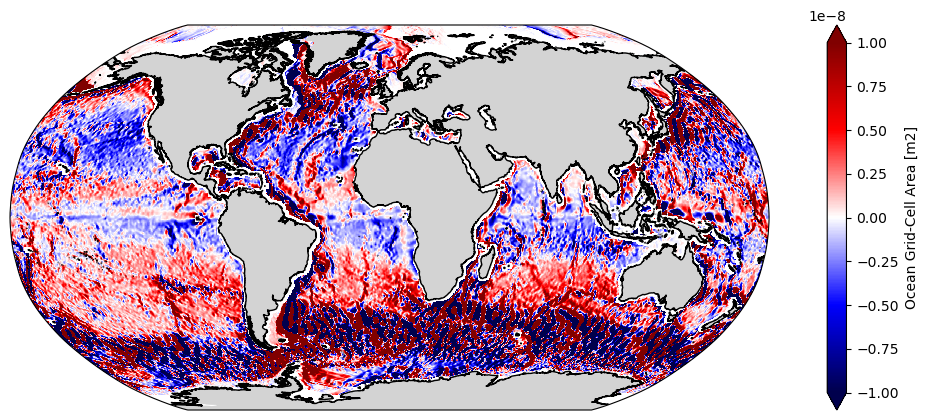

In [36]:
fig, axes = plt.subplots(1, 1, subplot_kw={'projection':ccrs.Robinson()}, figsize=(15,5))
BPT_g['beta_V'].plot(ax=axes, transform=ccrs.PlateCarree(), cmap='seismic', vmin=-1e-8, vmax=1e-8)
axes.add_feature(cfeature.LAND, facecolor='lightgrey')
axes.coastlines(resolution='10m')
plt.show()

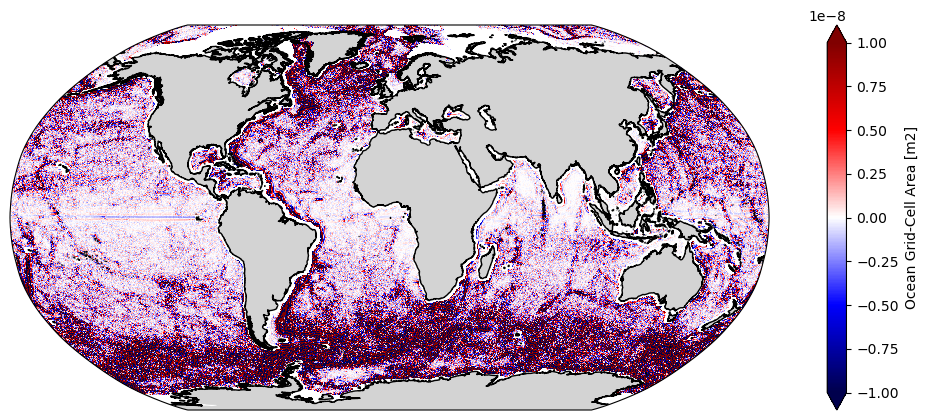

In [27]:
fig, axes = plt.subplots(1, 1, subplot_kw={'projection':ccrs.Robinson()}, figsize=(15,5))
BPT_g['Curl_diff'].plot(ax=axes, transform=ccrs.PlateCarree(), cmap='seismic', vmin=-1e-8, vmax=1e-8)
axes.add_feature(cfeature.LAND, facecolor='lightgrey')
axes.coastlines(resolution='10m')
plt.show()

In [107]:
BPT_g.rename({'xq':'lon','yq':'lat'}).drop(['geolat_c', 'geolon_c']).transpose('lat', 'lon').to_netcdf('Data_Step2/BPT_g.nc')

In [8]:
col_height = xr.open_dataset('MOM6/hollingsWill/climZOS_and_col_height_aka_SSH_and_Depth.nc')['col_height'].rename({'yh':'lat', 'xh':'lon'}).mean(axis=0)

# Ensure that longitude coords are from -180 to 180
# col_height.coords['lon'] = (col_height.coords['lon'] + 180) % 360 - 180
# col_height = col_height.sortby(col_height.lon)

In [12]:
def makeFig_global_new(lables_plot_xr, num_clusters, title='', cmap=None):
    if cmap == None:
        cmap = plt.get_cmap('tab20', num_clusters)
    fig, axes = plt.subplots(1, 1, subplot_kw={'projection':ccrs.Robinson()}, figsize=(15,5))#, constrained_layout=True)
    lables_plot_xr.plot(ax=axes, transform=ccrs.PlateCarree(), cmap=cmap)
    axes.add_feature(cfeature.LAND, facecolor='lightgrey')
    axes.coastlines(resolution='10m')
    axes.set_title(title)
    
    gl = axes.gridlines(crs=ccrs.PlateCarree(), linewidth=1, color='black', alpha=0.5, linestyle='--', draw_labels=True)
    gl.top_labels = False
    
    plt.show()
    
def makeFig_northAtlantic_new(lables_plot_xr, num_clusters, title=''):
    fig, axes = plt.subplots(1, 1, subplot_kw={'projection':ccrs.Mercator()}, figsize=(15,10))#, constrained_layout=True)
    xr.plot.contour(col_height.sel(lon=slice(-80,10)).sel(lat=slice(10,70)), ax=axes,
                    transform=ccrs.PlateCarree(), colors='black', linewidths=0.5)
    lables_plot_xr.sel(lon=slice(-80,10)).sel(lat=slice(10,70)).plot(ax=axes, transform=ccrs.PlateCarree(),
                                                                     cmap=plt.get_cmap('tab20', num_clusters))
    axes.add_feature(cfeature.LAND, facecolor='lightgrey')
    axes.coastlines(resolution='10m')
    axes.set_title(title)
    
    gl = axes.gridlines(crs=ccrs.PlateCarree(), linewidth=1, color='black', alpha=0.5, linestyle='--', draw_labels=True)
    gl.top_labels = False
    
    plt.show()
    
def makeFig_southernOcean_new(lables_plot_xr, num_clusters, title=''):
    fig, axes = plt.subplots(1, 1, subplot_kw={'projection':ccrs.Mercator()}, figsize=(15,5))#, constrained_layout=True)
    xr.plot.contour(col_height.sel(lon=slice(-80,100)).sel(lat=slice(-80,-40)), ax=axes,
                    transform=ccrs.PlateCarree(), colors='black', linewidths=0.5)
    lables_plot_xr.sel(lon=slice(-80,100)).sel(lat=slice(-80,-40)).plot(ax=axes, transform=ccrs.PlateCarree(),
                                                                     cmap=plt.get_cmap('tab20', num_clusters))
    axes.add_feature(cfeature.LAND, facecolor='lightgrey')
    axes.coastlines(resolution='10m')
    axes.set_title(title)
    
    gl = axes.gridlines(crs=ccrs.PlateCarree(), linewidth=1, color='black', alpha=0.5, linestyle='--', draw_labels=True)
    gl.top_labels = False
    
    plt.show()

In [13]:
def Plot_NestedClusters(clusterNumber, cut, sigma, ensembleSize):
    ''' Retrieve the clusters for the given cut and desired cluster number. '''
    #my_cmap =plt.get_cmap('tab20',clusterNumber+1)
    #regimeColours=my_cmap.colors[:,0:3]

    SIGMA=sigma

    L=[]
    for cut in [cut]:
        for testClusters in [clusterNumber]:  
            print('Looking at', testClusters, 'using cut', cut)

            L_names = ['aggloMod_UMAP150_3D_odiv230_32Chunk_sigma'+str(SIGMA)+'_'+str(i)+'_nNeig40_'+str(cut)+'.npy'
               for i in np.arange(1, ensembleSize)]
            dataSize = np.load('/archive/Maike.Sonnewald/MOM6/agglomerateClustering/'+L_names[1]).shape
            for i in range(len(L_names)):
                L.append(retLabels(L_names[i], testClusters, dataSize))
                #print(L_names[i])

            L_baseline = retLabels(L_names[1], testClusters, dataSize)

            sortedOverlap = AsessClusterOverlap_voted(L_baseline, L, testClusters, cut)
            aggOverlaps = np.nansum(sortedOverlap,axis=0)
            voteOverlaps = np.argmax(aggOverlaps,axis=0)
            cls = np.nan * np.ones(ds1['BPT'].shape[0]*ds1['BPT'].shape[1])

            cls[landInd] = voteOverlaps
                #print(dd, np.nansum(dummy))
            lables_plot = np.reshape(cls,landMask.shape)[::-1,:]
            overallArea = np.nansum(area*oceanMask)
            num_overlap = np.sum((~np.isnan(np.flipud(lables_plot)))*(area*oceanMask))
            percCovered = (int(num_overlap) / overallArea)*100
            print('Area covered: ', percCovered, overallArea, int(num_overlap))
            #makeFig_global(np.fliplr(np.rot90(lables_plot,2)), 0,testClusters+1,1,'Common clusters '+str(testClusters)+' with cut '+str(cut), 'test.png')
            #makeFigZoomBathymetry(np.fliplr(np.rot90(lables_plot,2)), 0,testClusters+1,1,'Common clusters '+str(testClusters)+' with cut '+str(cut), 'test.png',llcrnrlon=-80, urcrnrlon=10, llcrnrlat=10, urcrnrlat=70)
            #makeFigZoomBathymetry(np.fliplr(np.rot90(lables_plot,2)), 0,testClusters+1,1,'Common clusters '+str(testClusters)+' with cut '+str(cut), 'test.png',llcrnrlon=-80, urcrnrlon=100, llcrnrlat=-80, urcrnrlat=-40)
            #makeFigZoomBathymetry(np.fliplr(np.rot90(lables_plot,2)), 0,testClusters,1,'Common clusters '+str(testClusters)+' with cut '+str(cut), 'test.png',llcrnrlon=-150, urcrnrlon=-70, llcrnrlat=-20, urcrnrlat=20)
    
            lables_plot_xr = xr.DataArray(data=np.flipud(lables_plot),
                                          dims=['lat','lon'],
                                          coords=dict(lat=col_height['lat'], lon=col_height['lon']),
                                          name='Cluster')
            makeFig_global_new(lables_plot_xr, clusterNumber, f'Common clusters {str(testClusters)} with cut {str(cut)}')
            makeFig_northAtlantic_new(lables_plot_xr, clusterNumber, f'Common clusters {str(testClusters)} with cut {str(cut)}')
            makeFig_southernOcean_new(lables_plot_xr, clusterNumber, f'Common clusters {str(testClusters)} with cut {str(cut)}')
            
    return lables_plot, sortedOverlap

### That was a long pre-amble... Let's get to the interesting stuff: the dynamical regimes!!

There's perhaps an excessive amount of print statements. Modify at will!

Looking at 6 using cut 350
Area covered:  100.0 316433709989256.0 316433709989256


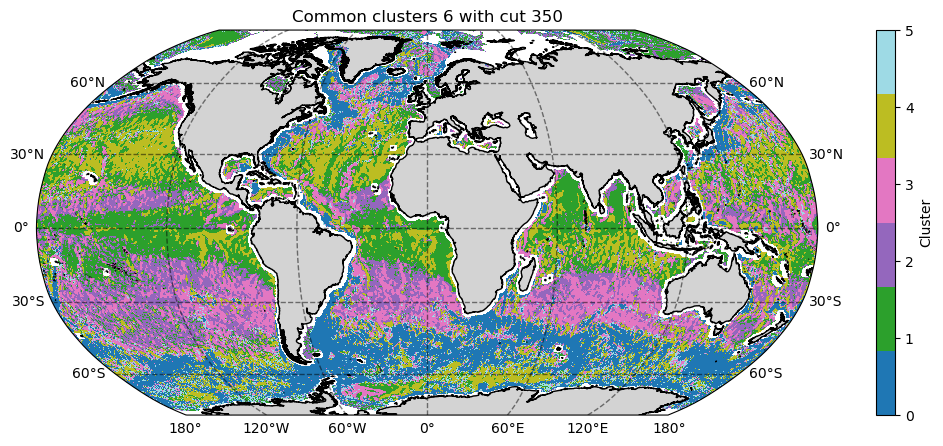

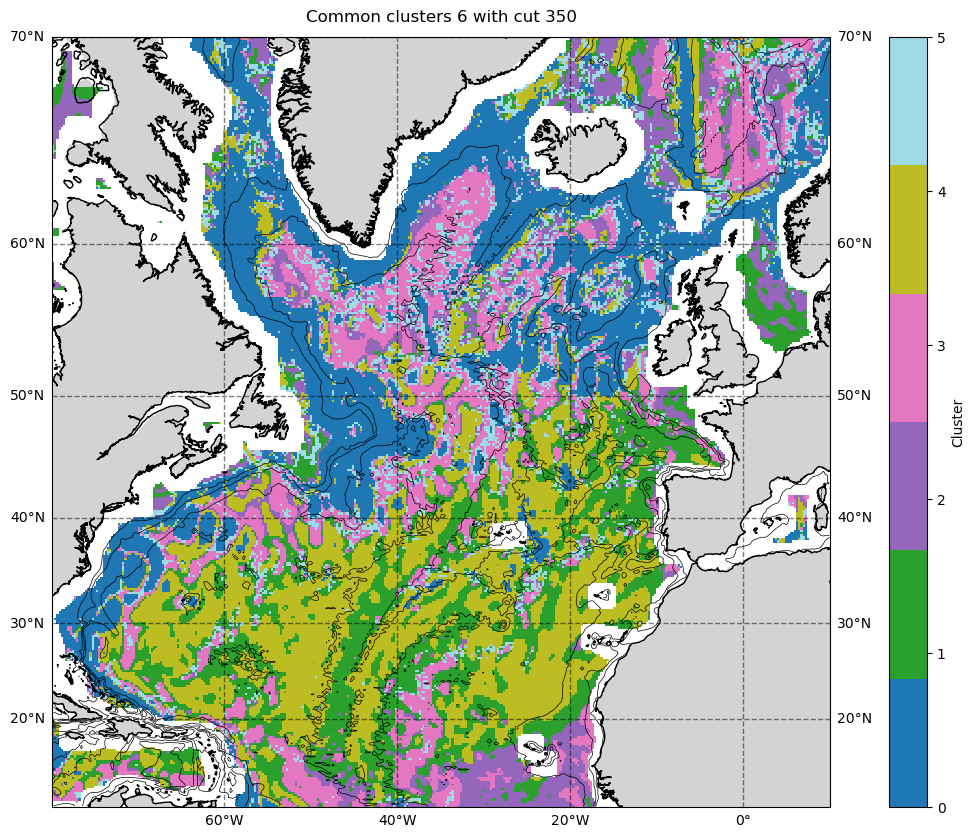

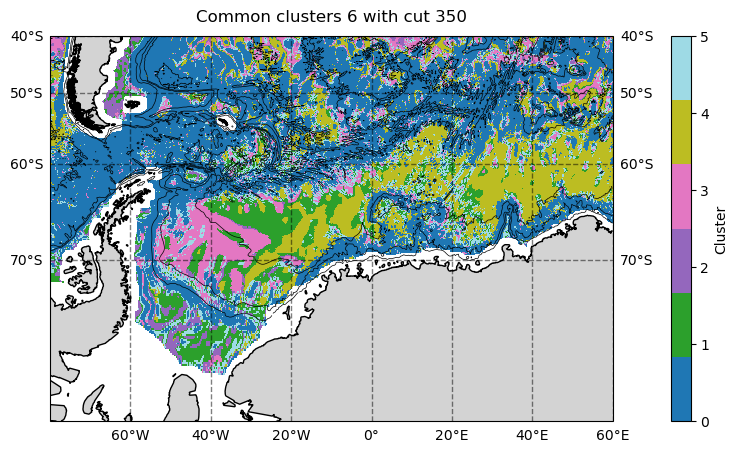

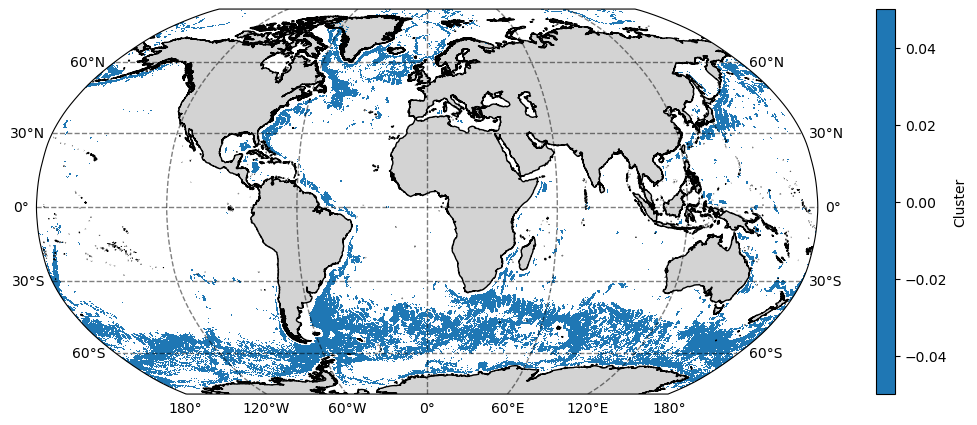

Area:  16.344667327040494
-8.527876253213582e-11
plotting


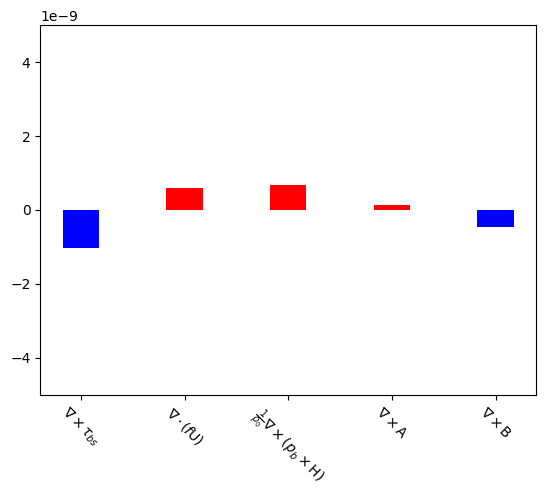

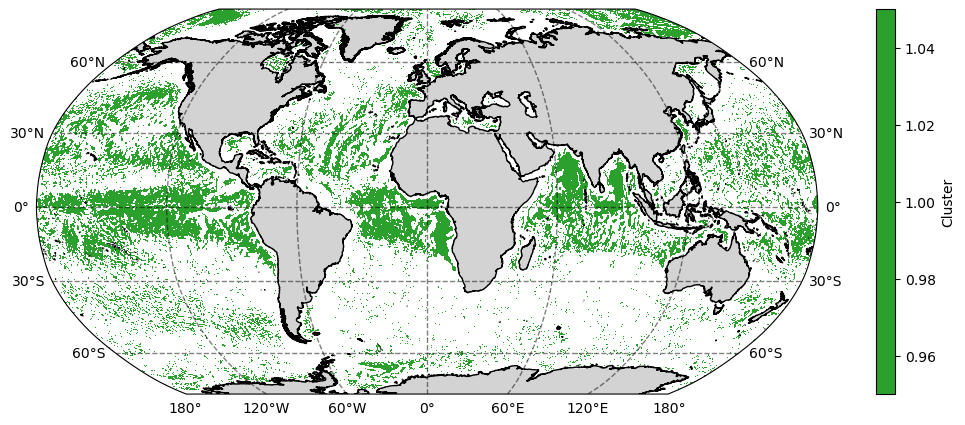

Area:  24.318209851324863
-1.0237058971843648e-12
plotting


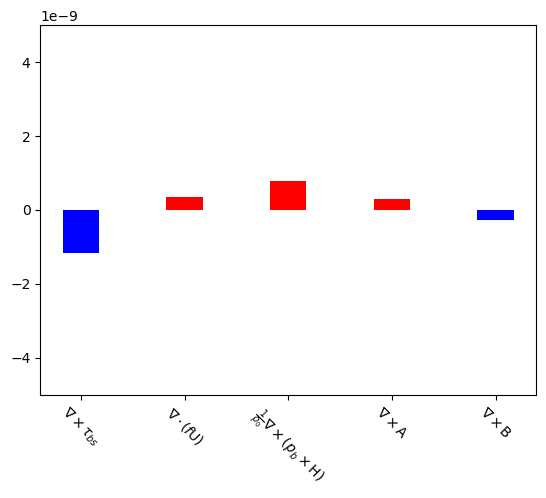

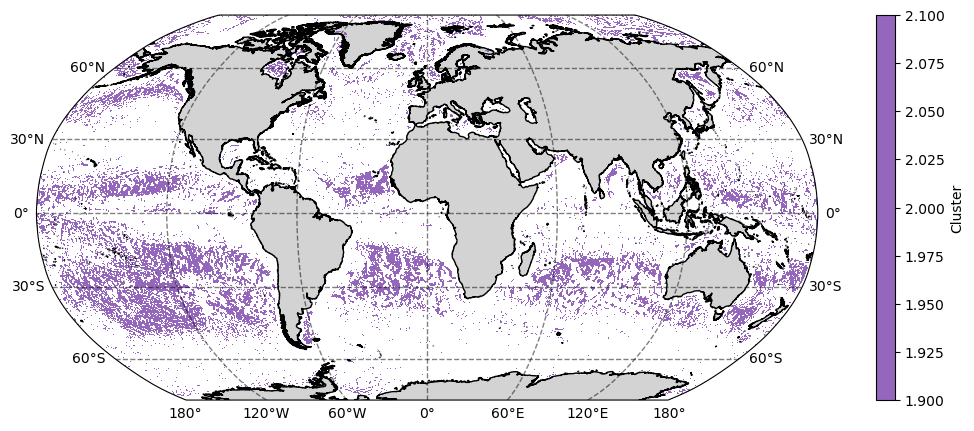

Area:  16.979962182028054
5.202854879628546e-11
plotting


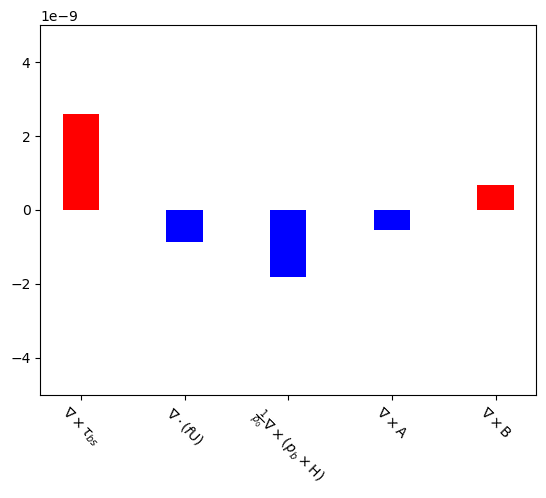

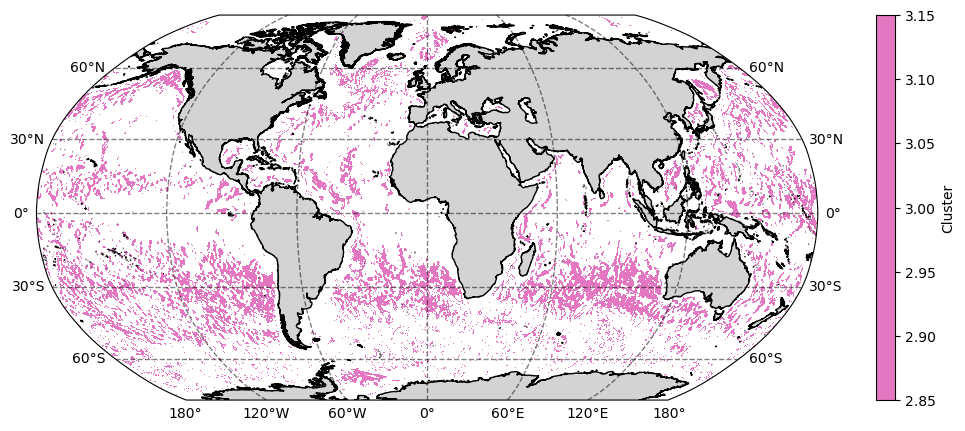

Area:  17.755282799383046
3.789480463171713e-11
plotting


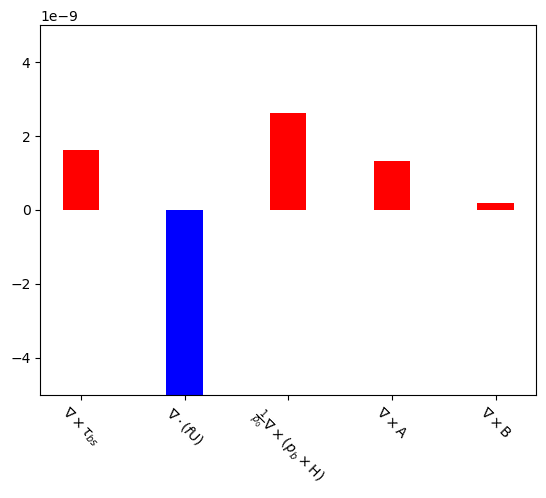

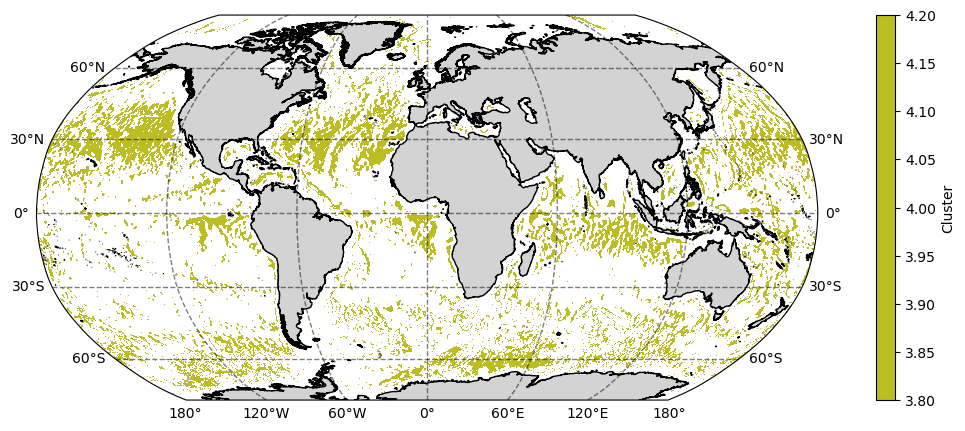

Area:  18.779452540113272
-2.4918453216853574e-11
plotting


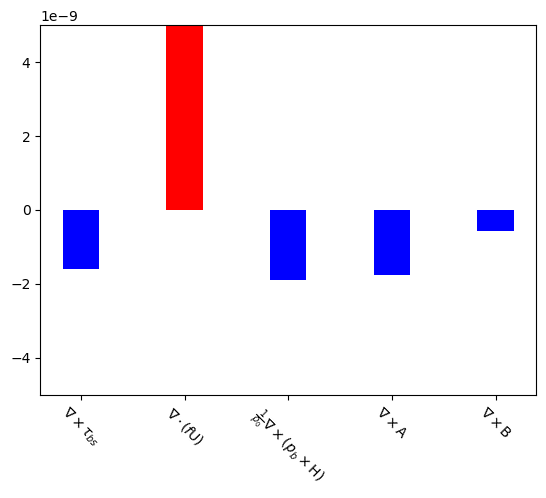

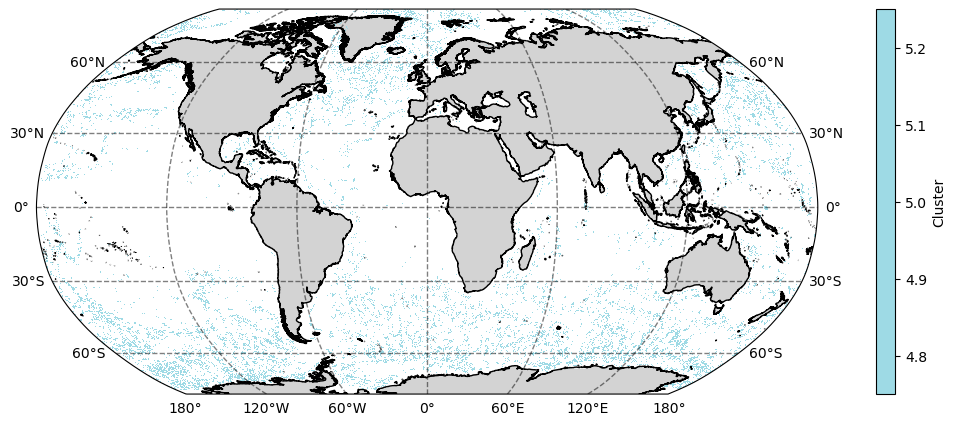

Area:  5.82242530011027
2.1702638219455073e-11
plotting


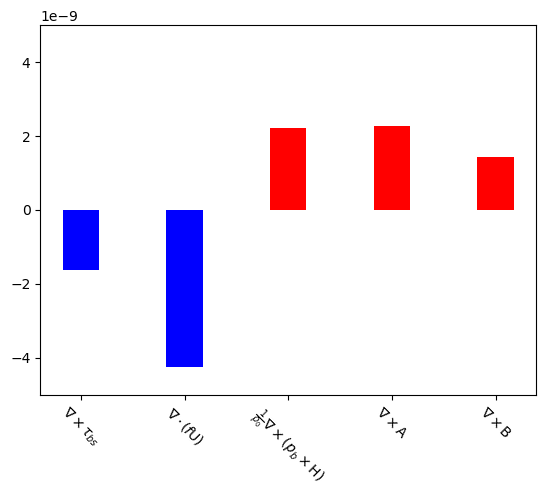

In [16]:
numberOfClustersToAssess=6
placeToCutAgglomerative=350
SIGMA_set=1
ensembleSizeUsed=160

#my_cmap =plt.get_cmap('tab20',numberOfClustersToAssess+1)
#regimeColours=my_cmap.colors[:,0:3]

lables_plot, sortedOverlap = Plot_NestedClusters(numberOfClustersToAssess, placeToCutAgglomerative, SIGMA_set, ensembleSizeUsed)
# Note similarity to original clusters from the low resolution 2019 paper.

# Plot the associated term balances for good measure. Takes a while. I partition the terms slightly differently.
for clNr in np.arange(numberOfClustersToAssess): plotBarchartReturnBars(lables_plot, clNr, numberOfClustersToAssess)

In [17]:
zos = xr.open_dataset('MOM6/hollingsWill/climZOS_and_col_height_aka_SSH_and_Depth.nc')['zos'].rename({'yh':'lat', 'xh':'lon'}).mean(axis=0)

mom6_labels = xr.DataArray(data=np.flipud(lables_plot),
                           dims=['lat','lon'],
                           coords=dict(lat=zos['lat'], lon=zos['lon']),
                           name='Label')
# Ensure that longitude coords are from -180 to 180
mom6_labels.coords['lon'] = (mom6_labels.coords['lon'] + 180) % 360 - 180
mom6_labels = mom6_labels.sortby(mom6_labels.lon)

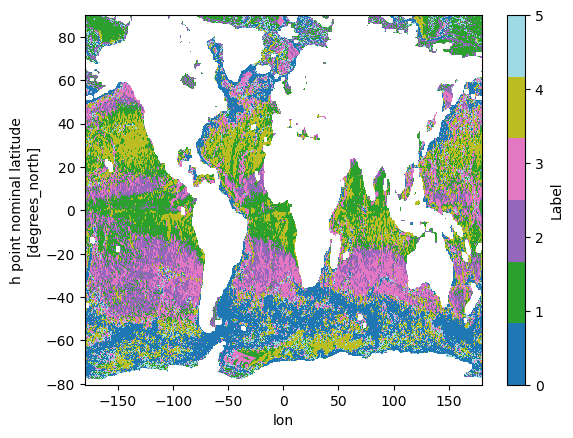

In [18]:
mom6_labels.plot(cmap=plt.get_cmap('tab20',numberOfClustersToAssess))
plt.show()

In [14]:
mom6_labels.to_netcdf(f'Data_Step2/mom6_labels_{numberOfClustersToAssess}_clusters.nc')

In [83]:
aggOverlaps = np.nansum(sortedOverlap,axis=0)
#voteOverlaps = np.argmax(aggOverlaps,axis=0)
firstVoteOverlaps = aggOverlaps.argsort(axis=0)[-1,:]
firstVoteOverlaps = np.where(firstVoteOverlaps == 6, 0, firstVoteOverlaps)

secondVoteOverlaps = aggOverlaps.argsort(axis=0)[-2,:]
secondVoteOverlaps = np.where(secondVoteOverlaps == 6, 0, secondVoteOverlaps)

cls_1 = np.nan * np.ones(ds1['BPT'].shape[0]*ds1['BPT'].shape[1])
cls_1[landInd] = firstVoteOverlaps

cls_2 = np.nan * np.ones(ds1['BPT'].shape[0]*ds1['BPT'].shape[1])
cls_2[landInd] = secondVoteOverlaps

lables_plot_1 = np.reshape(cls_1,landMask.shape)[::-1,:]
lables_plot_2 = np.reshape(cls_2,landMask.shape)[::-1,:]

lables_plot_1_xr = xr.DataArray(data=np.flipud(lables_plot_1),
                                dims=['lat','lon'],
                                coords=dict(lat=col_height['lat'], lon=col_height['lon']),
                                name='Cluster')
lables_plot_2_xr = xr.DataArray(data=np.flipud(lables_plot_2),
                                dims=['lat','lon'],
                                coords=dict(lat=col_height['lat'], lon=col_height['lon']),
                                name='Cluster')

In [84]:
# For an unknown reason (for now), the aggOverlaps array has an extra
# row which is only filled with zeros, let's get rid of it
cluster_probs = aggOverlaps[:-1,:]

# Divide each element in each column by the sum of the column
cluster_probs = cluster_probs / np.sum(cluster_probs, axis=0)

# Some of the column sums were 0, so some of cluster_probs columns
# are all nans, let's replace those with a filler vector which represents
# a 100% chance of regime 0
for i in range(cluster_probs.shape[1]):
    if np.any(np.isnan(cluster_probs[:,i])):
        cluster_probs[:,i] = np.array([1,0,0,0,0,0])
        
np.any(np.isnan(cluster_probs))

False

In [85]:
np.all(np.isclose(np.sum(cluster_probs, axis=0), 1))

True

In [102]:
cluster_probs_full = np.nan * np.ones((ds1['BPT'].shape[0]*ds1['BPT'].shape[1],6))
cluster_probs_full[landInd] = cluster_probs.transpose()
cluster_probs_full = cluster_probs_full.reshape(1080,1440,6)

In [103]:
cluster_probs_full = xr.DataArray(data=cluster_probs_full,
                                  dims=['lat','lon','regime'],
                                  coords=dict(lat=col_height['lat'], lon=col_height['lon'],regime=list(range(6))),
                                  name='Regime probability')

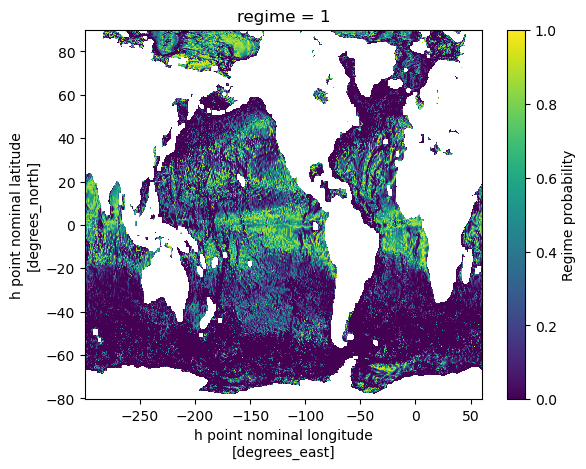

In [107]:
cluster_probs_full.sel(regime=1).plot()

In [111]:
np.sum(landInd)

834418

In [109]:
cluster_probs_full.to_netcdf('Data_Step2/regime_probs.nc')

In [13]:
# Ensure that longitude coords are from -180 to 180
lables_plot_1_xr.coords['lon'] = (lables_plot_1_xr.coords['lon'] + 180) % 360 - 180
lables_plot_1_xr = lables_plot_1_xr.sortby(lables_plot_1_xr.lon)

lables_plot_2_xr.coords['lon'] = (lables_plot_2_xr.coords['lon'] + 180) % 360 - 180
lables_plot_2_xr = lables_plot_2_xr.sortby(lables_plot_2_xr.lon)

In [14]:
aggOverlaps[:,0]

array([ 0., 11.,  0.,  1.,  4., 18.,  0.])

In [15]:
np.unique(np.sum(aggOverlaps, axis=0), return_counts=True)

(array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
         11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
         22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
         33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,
         44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,
         55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
         66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,
         77.,  78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,
         88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,
         99., 100., 101., 102., 103., 104., 105., 106., 107., 108., 109.,
        110., 111., 112., 113., 114., 115., 116., 117., 118., 119., 120.,
        121., 122., 123., 124., 125., 126., 127., 128., 129., 130., 131.,
        132., 133., 134., 135., 136., 137., 138., 139., 140., 141., 142.,
        143., 144., 145., 146., 147., 

In [18]:
np.unique(lables_plot, return_counts=True)

(array([ 0.,  1.,  2.,  3.,  4.,  5., nan]),
 array([203153, 175315, 124707, 117606, 136915,  76722, 720782]))

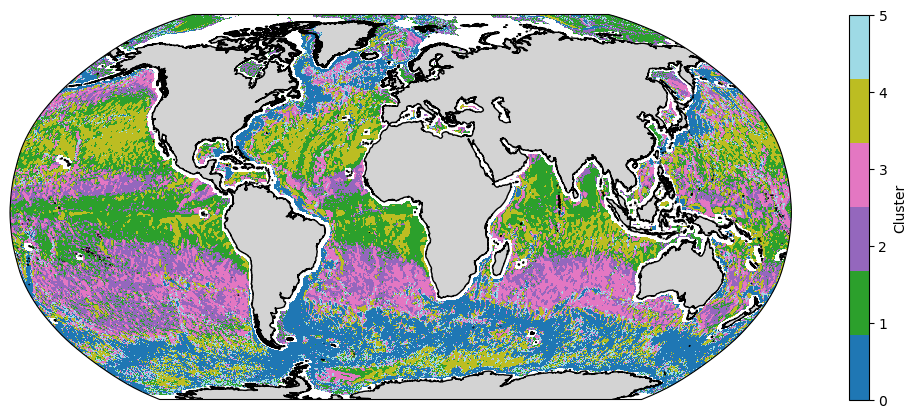

In [29]:
fig, axes = plt.subplots(1, 1, subplot_kw={'projection':ccrs.Robinson()}, figsize=(15,5))
lables_plot_1_xr.plot(ax=axes, transform=ccrs.PlateCarree(), cmap=plt.get_cmap('tab20', 6))
axes.add_feature(cfeature.LAND, facecolor='lightgrey')
axes.coastlines(resolution='10m')
plt.show()

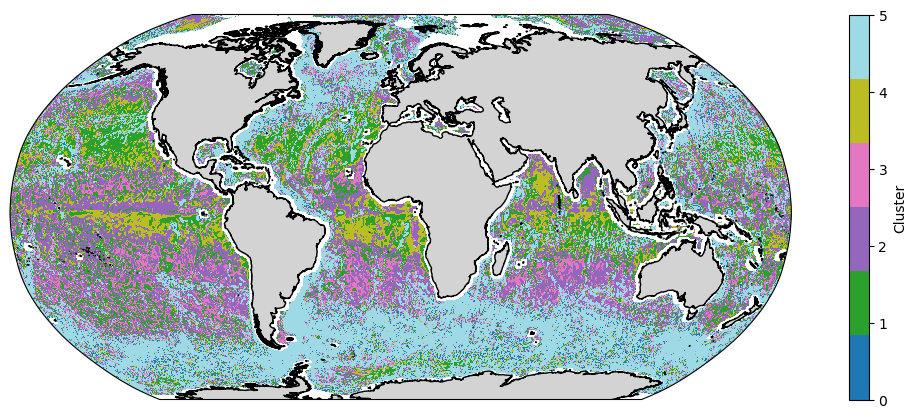

In [30]:
fig, axes = plt.subplots(1, 1, subplot_kw={'projection':ccrs.Robinson()}, figsize=(15,5))
lables_plot_2_xr.plot(ax=axes, transform=ccrs.PlateCarree(), cmap=plt.get_cmap('tab20', 6))
axes.add_feature(cfeature.LAND, facecolor='lightgrey')
axes.coastlines(resolution='10m')
plt.show()

In [31]:
lables_plot_1_xr.to_netcdf('Data_Step2/mom6_labels_first_vote.nc')
lables_plot_2_xr.to_netcdf('Data_Step2/mom6_labels_second_vote.nc')

Looking at 17 using cut 350
Area covered:  100.0 316433709989256.0 316433709989256


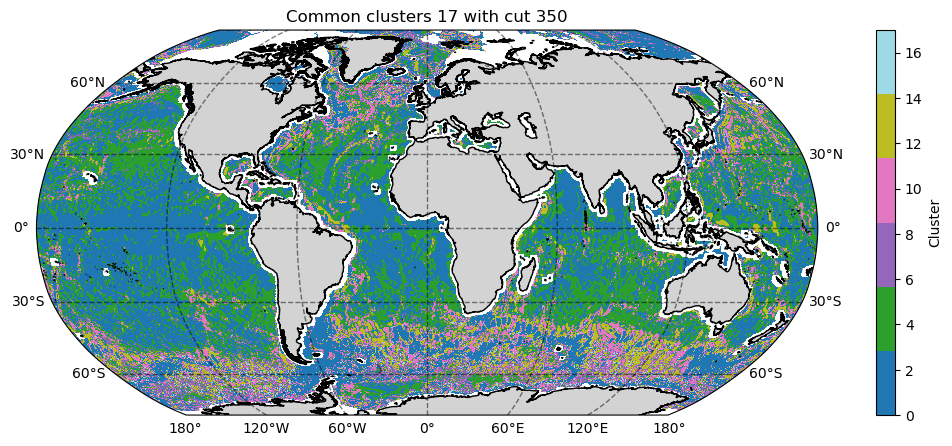

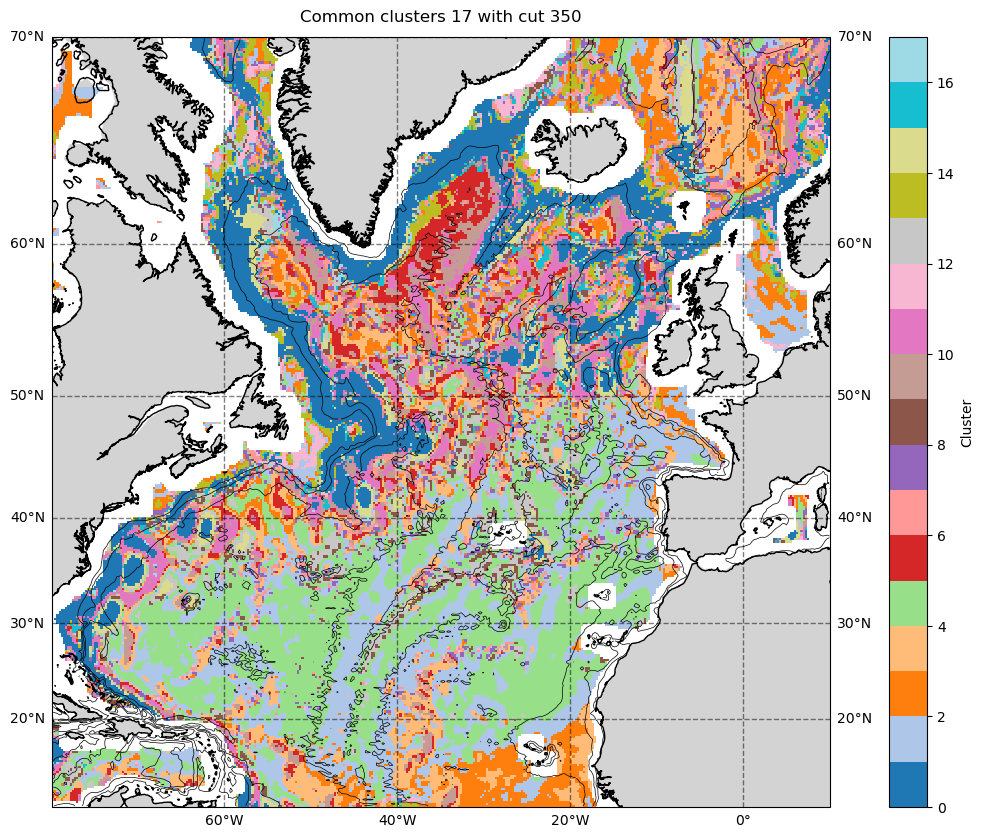

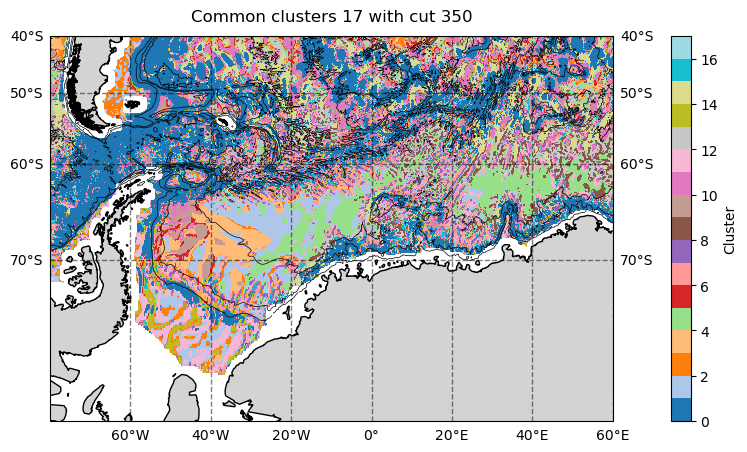

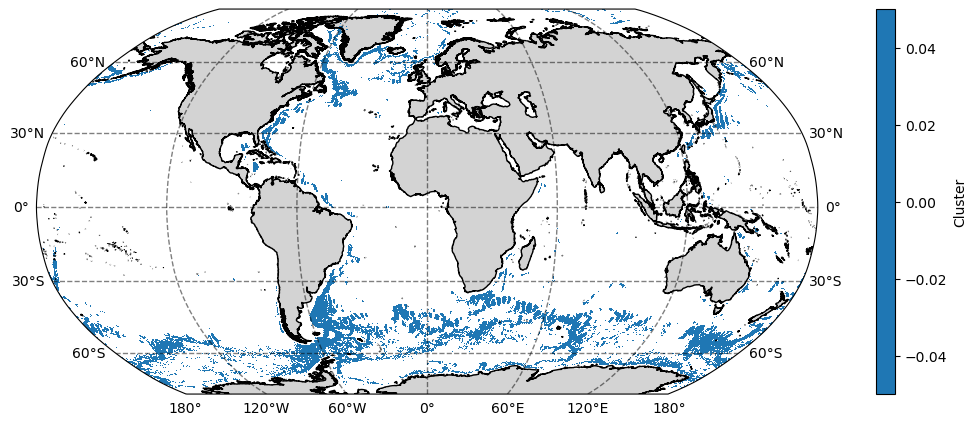

Area:  7.965530358145413
-2.217958000250158e-10
plotting


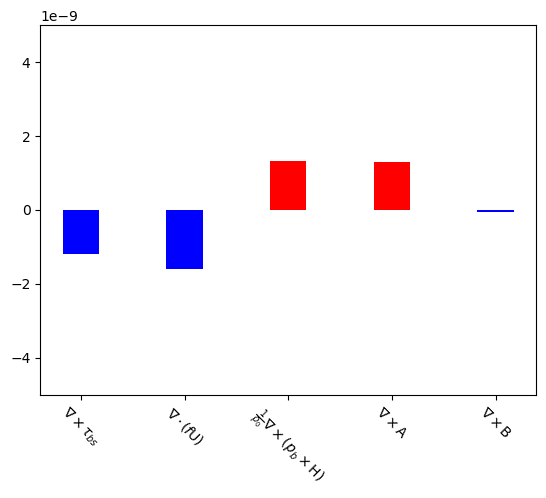

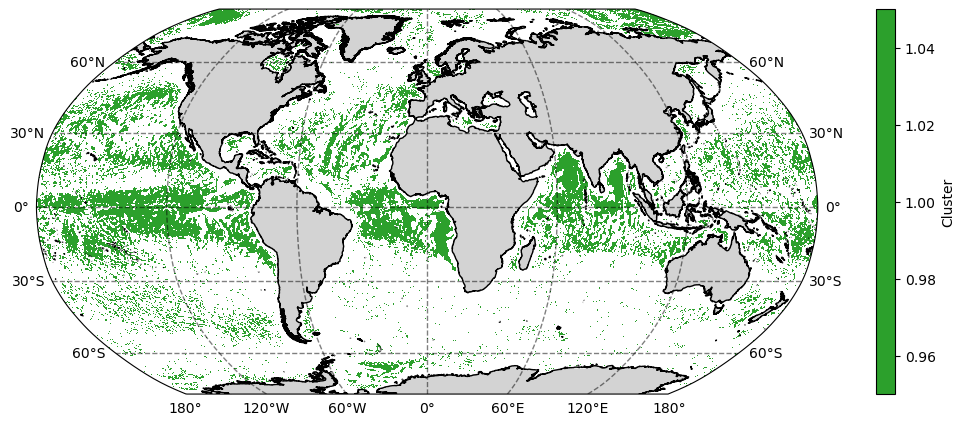

Area:  23.216849937112713
-3.2341381759129295e-15
plotting


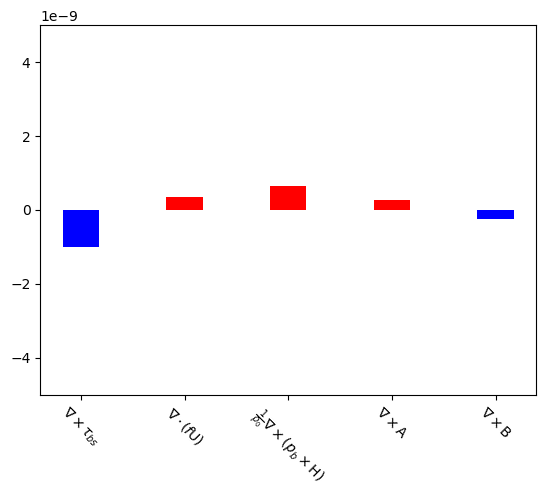

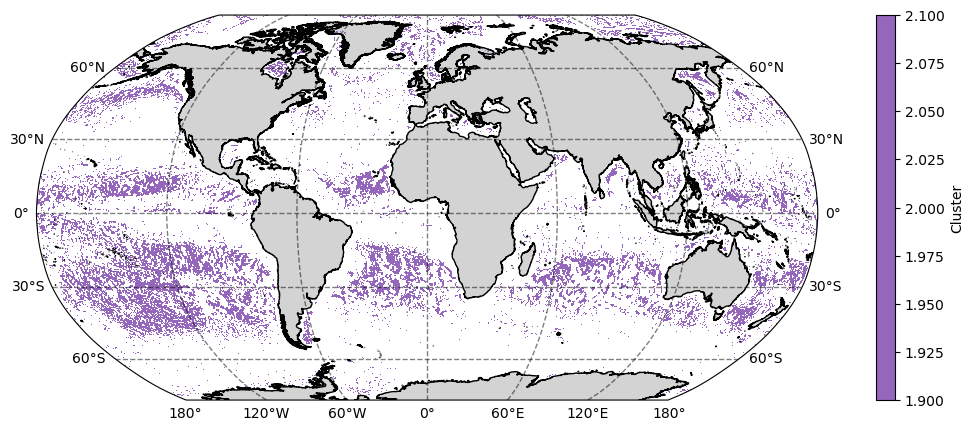

Area:  15.225762908984589
4.972403797039389e-11
plotting


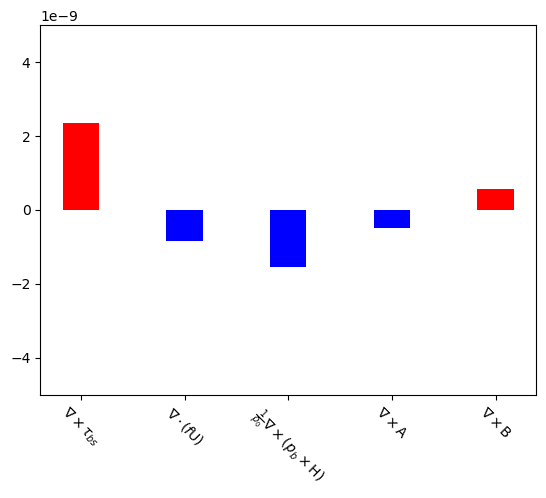

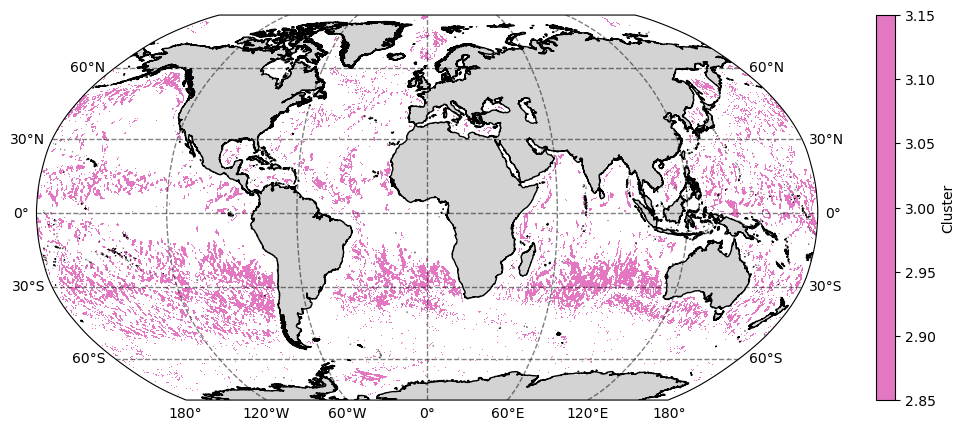

Area:  14.124061353073126
3.140089808848411e-11
plotting


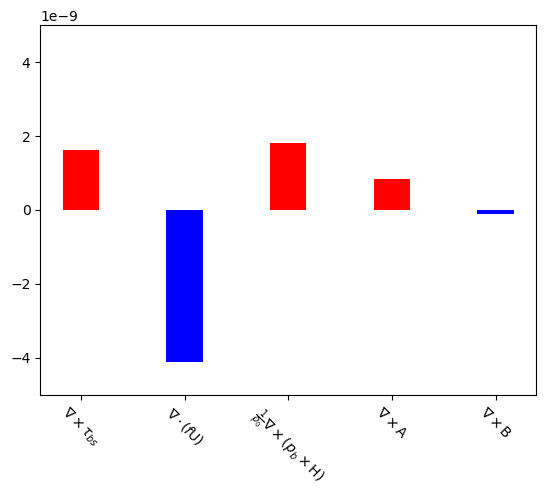

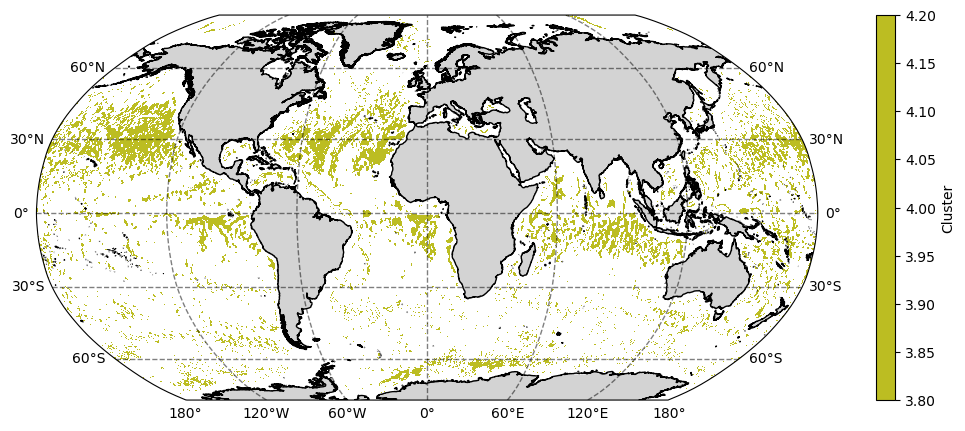

Area:  13.660100345770253
-2.371915784009799e-11
plotting


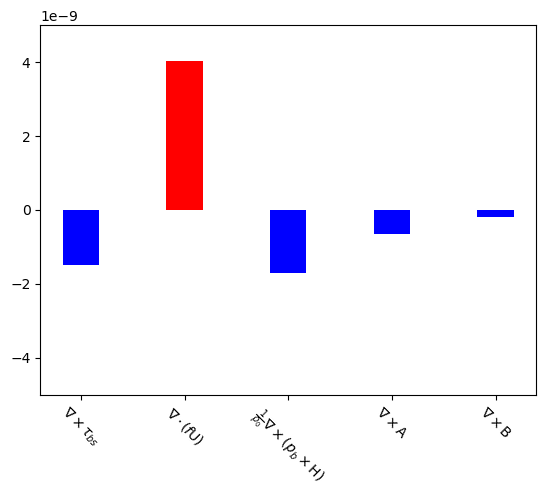

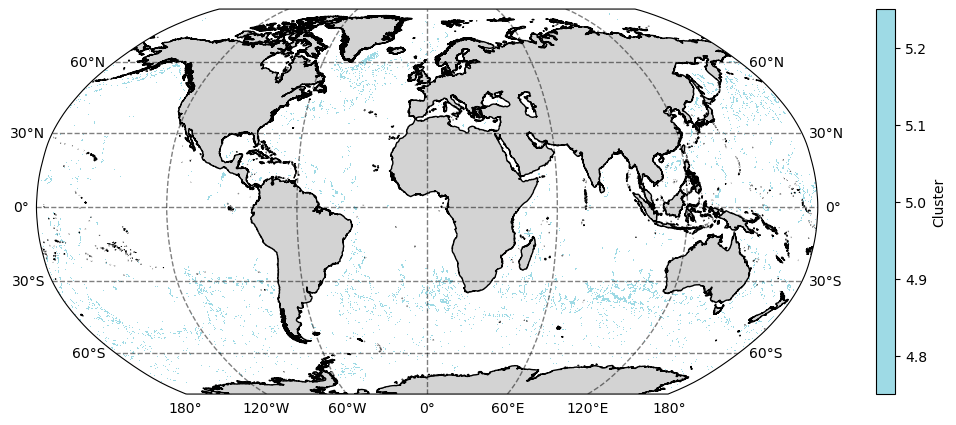

Area:  2.7170909325962533
9.828718282083512e-11
plotting


IndexError: index 6 is out of bounds for axis 0 with size 6

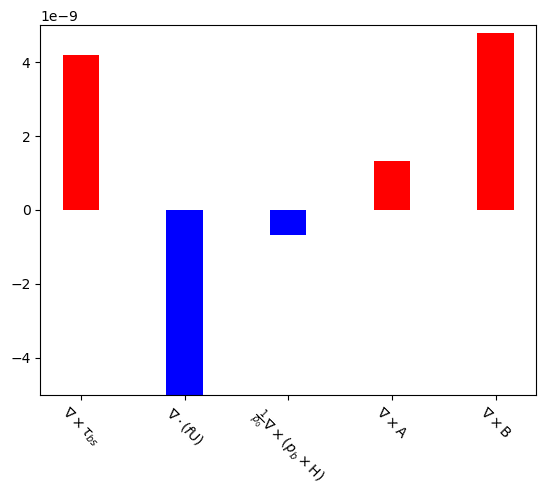

In [13]:
numberOfClustersToAssess=17
placeToCutAgglomerative=350
SIGMA_set=1
ensembleSizeUsed=160

my_cmap = plt.get_cmap('tab20',numberOfClustersToAssess+1)
#regimeColours=my_cmap.colors[:,0:3]

lables_plot, sortedOverlap = Plot_NestedClusters(numberOfClustersToAssess, placeToCutAgglomerative, SIGMA_set, ensembleSizeUsed)

for clNr in np.arange(numberOfClustersToAssess): plotBarchartReturnBars(lables_plot, clNr, numberOfClustersToAssess)

In [16]:
zos = xr.open_dataset('MOM6/hollingsWill/climZOS_and_col_height_aka_SSH_and_Depth.nc')['zos'].rename({'yh':'lat', 'xh':'lon'}).mean(axis=0)

mom6_labels = xr.DataArray(data=np.flipud(lables_plot),
                           dims=['lat','lon'],
                           coords=dict(lat=zos['lat'], lon=zos['lon']),
                           name='Label')
# Ensure that longitude coords are from -180 to 180
mom6_labels.coords['lon'] = (mom6_labels.coords['lon'] + 180) % 360 - 180
mom6_labels = mom6_labels.sortby(mom6_labels.lon)

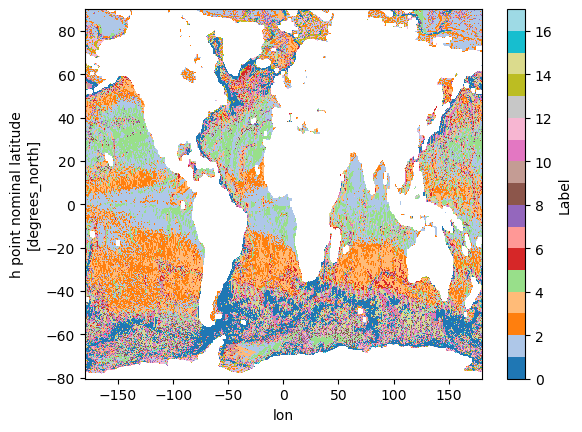

In [17]:
mom6_labels.plot(cmap=plt.get_cmap('tab20',numberOfClustersToAssess))
plt.show()

In [18]:
mom6_labels.to_netcdf(f'Data_Step2/mom6_labels_{numberOfClustersToAssess}_clusters.nc')

Looking at 10 using cut 350
Area covered:  100.0 316433709989256.0 316433709989256


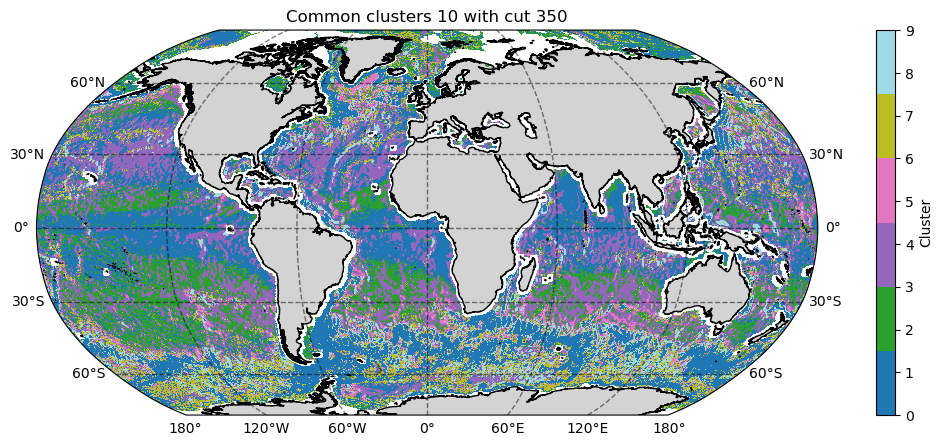

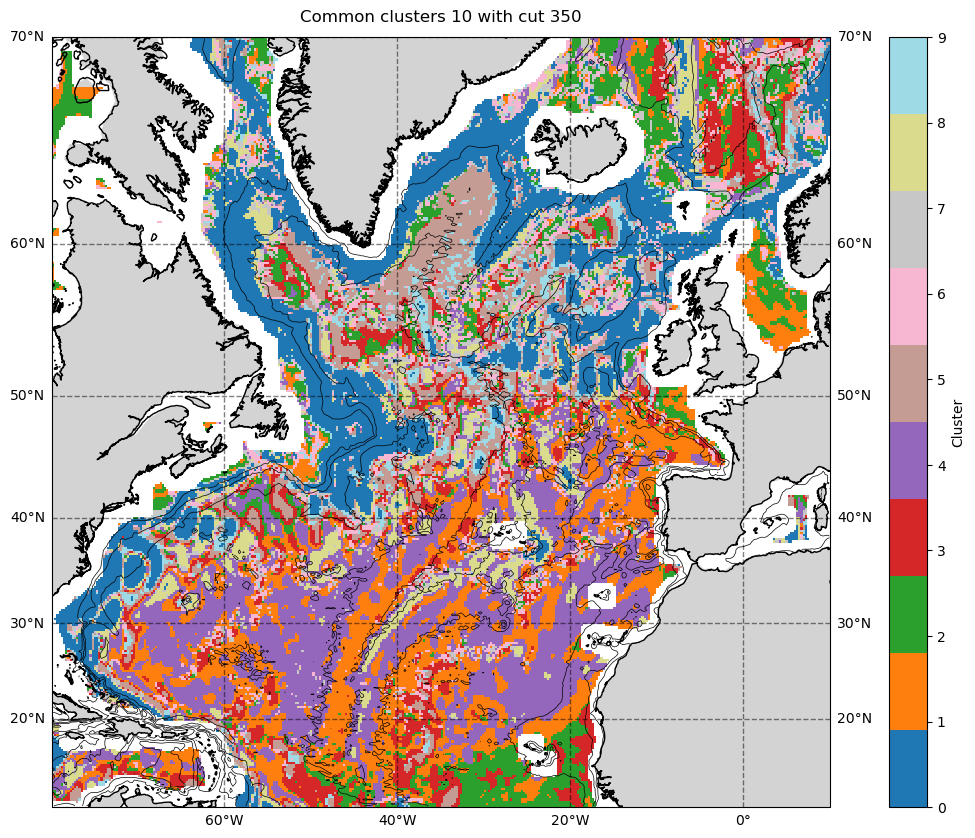

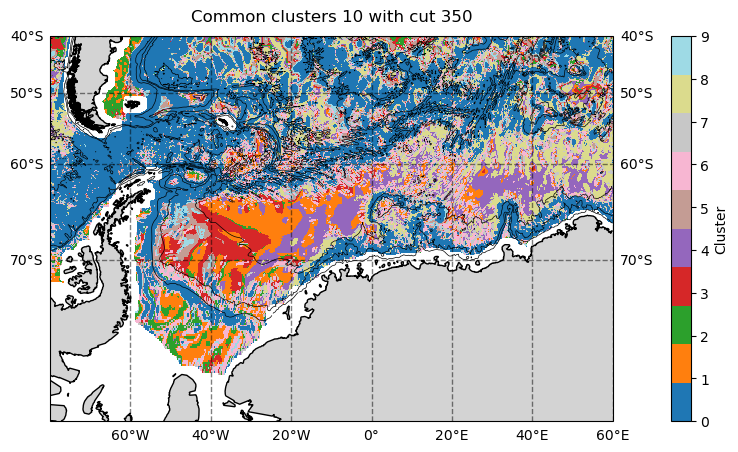

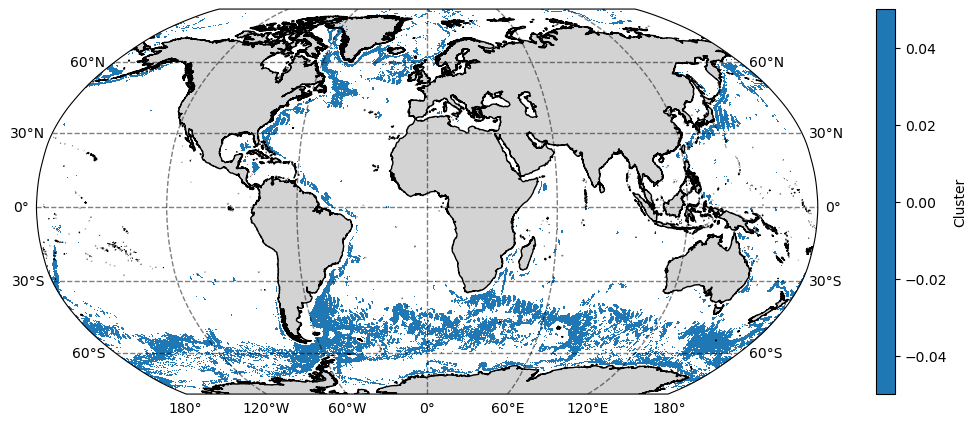

Area:  12.290008949480269
-1.2580307989116453e-10
plotting


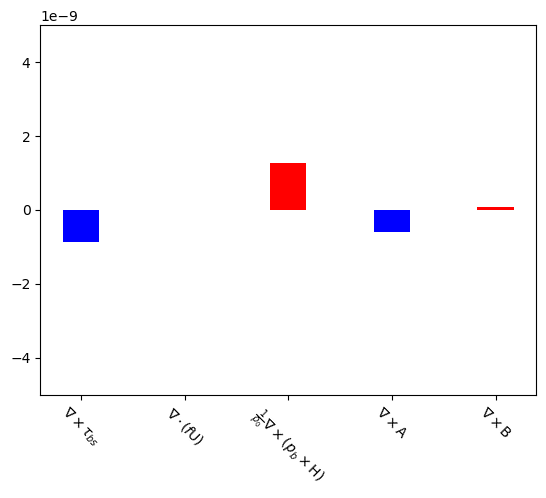

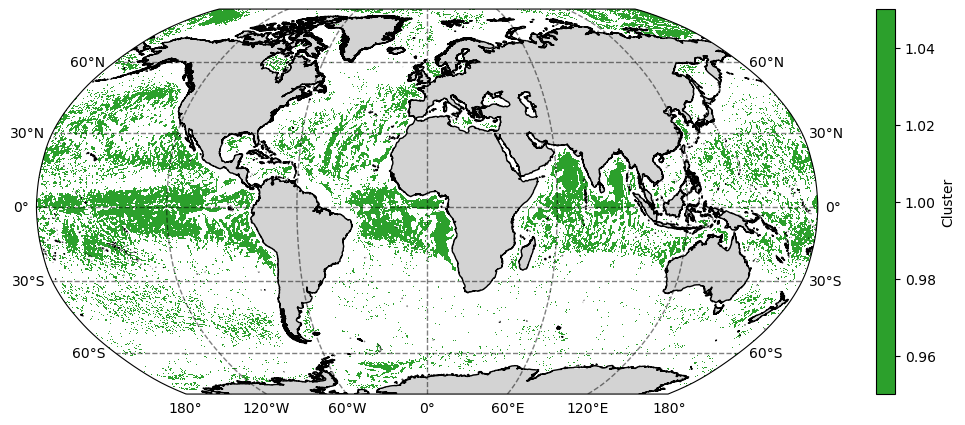

Area:  23.198919711263535
3.843916558006136e-13
plotting


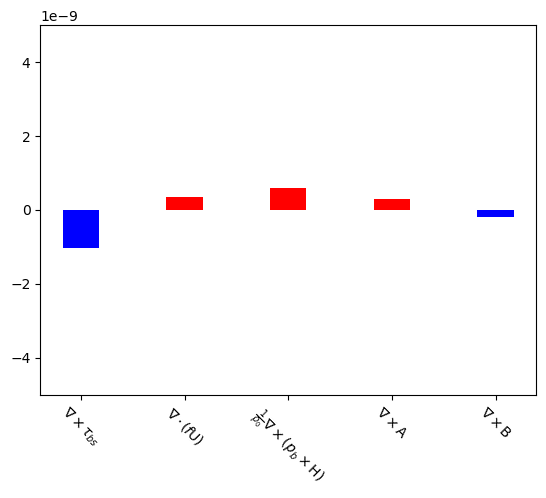

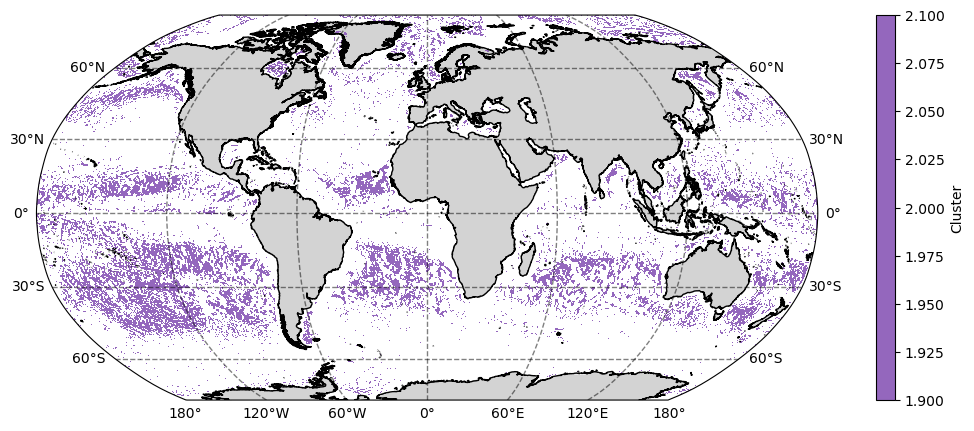

Area:  15.81859268199951
5.160471739399544e-11
plotting


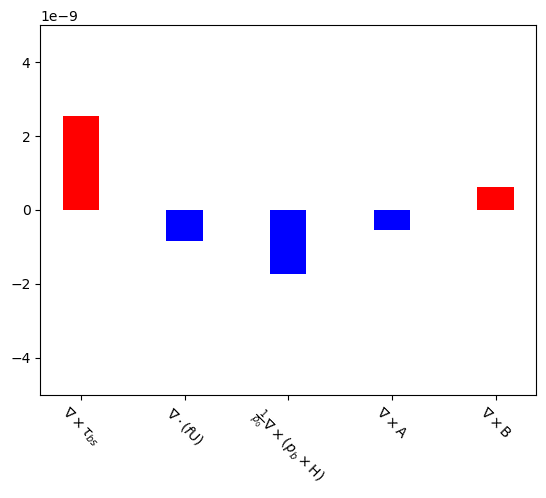

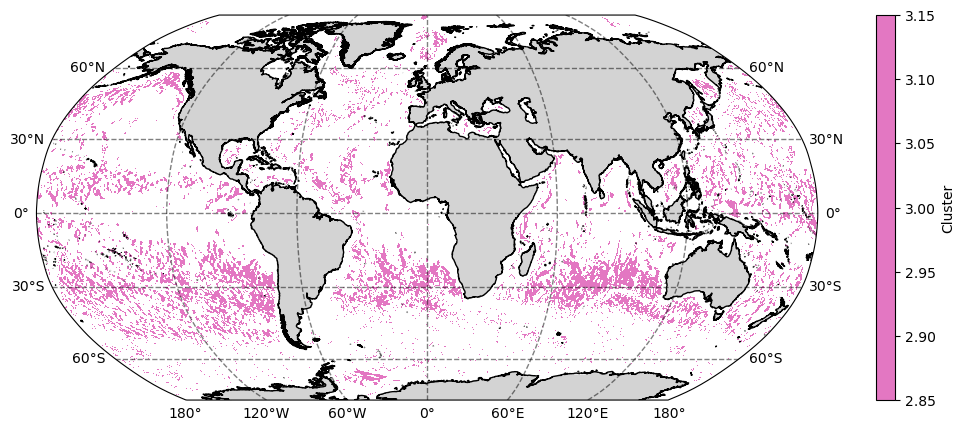

Area:  14.00884990336368
3.054759276912214e-11
plotting


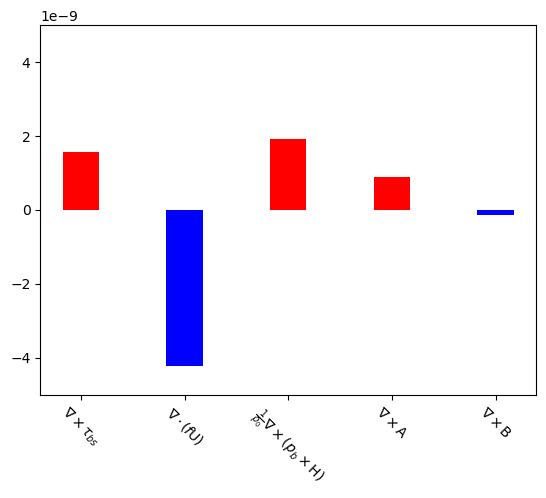

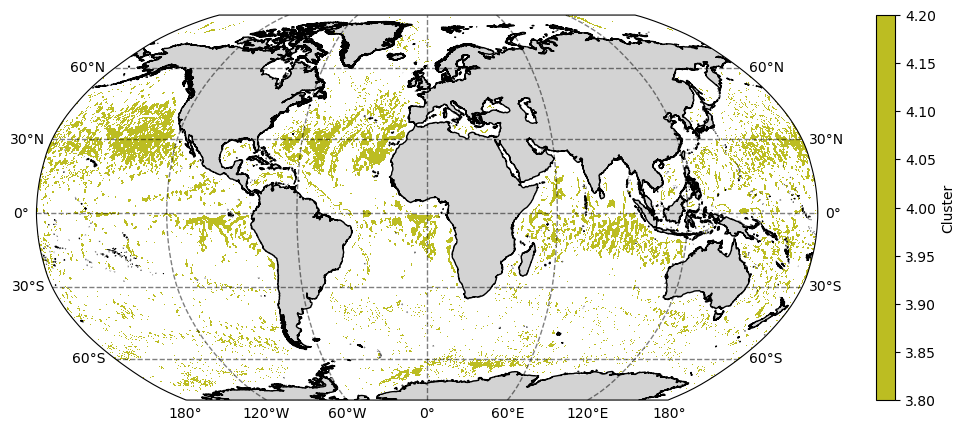

Area:  13.576098605308081
-2.293789430072535e-11
plotting


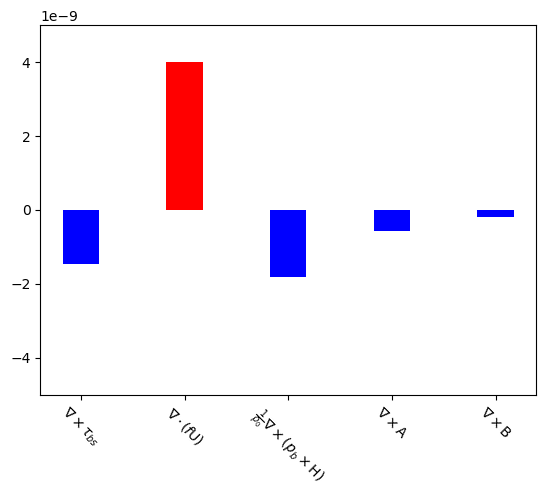

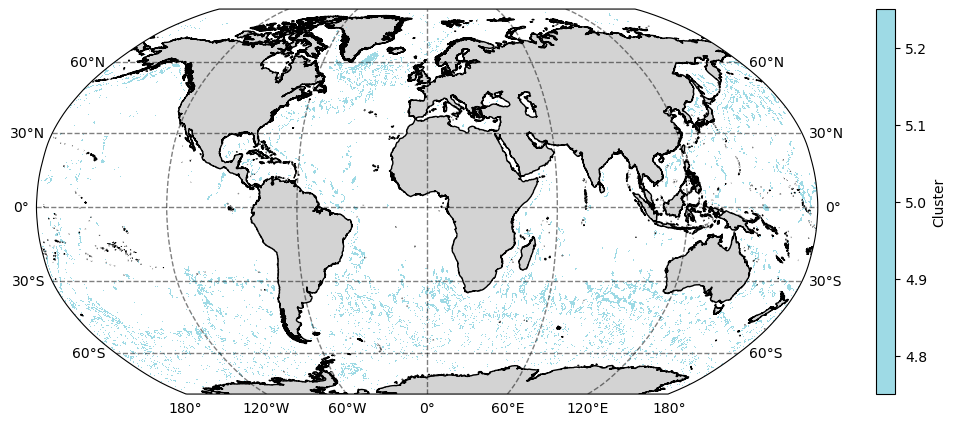

Area:  5.224865041854535
9.713277710044868e-11
plotting


IndexError: index 6 is out of bounds for axis 0 with size 6

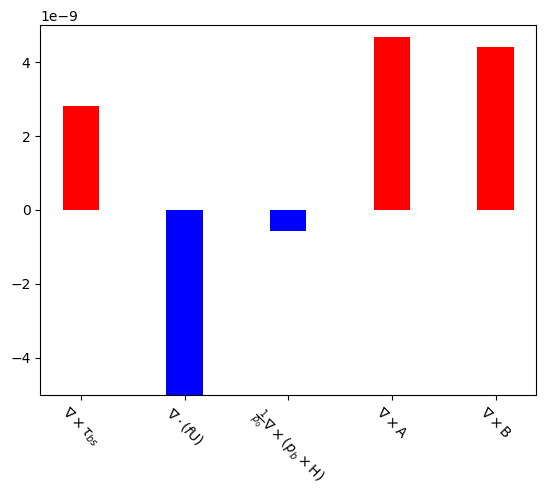

In [19]:
numberOfClustersToAssess=10
placeToCutAgglomerative=350
SIGMA_set=1
ensembleSizeUsed=160

my_cmap = plt.get_cmap('tab20',numberOfClustersToAssess+1)
#regimeColours=my_cmap.colors[:,0:3]

lables_plot, sortedOverlap = Plot_NestedClusters(numberOfClustersToAssess, placeToCutAgglomerative, SIGMA_set, ensembleSizeUsed)

for clNr in np.arange(numberOfClustersToAssess): plotBarchartReturnBars(lables_plot, clNr, numberOfClustersToAssess)

In [20]:
zos = xr.open_dataset('MOM6/hollingsWill/climZOS_and_col_height_aka_SSH_and_Depth.nc')['zos'].rename({'yh':'lat', 'xh':'lon'}).mean(axis=0)

mom6_labels = xr.DataArray(data=np.flipud(lables_plot),
                           dims=['lat','lon'],
                           coords=dict(lat=zos['lat'], lon=zos['lon']),
                           name='Label')
# Ensure that longitude coords are from -180 to 180
mom6_labels.coords['lon'] = (mom6_labels.coords['lon'] + 180) % 360 - 180
mom6_labels = mom6_labels.sortby(mom6_labels.lon)

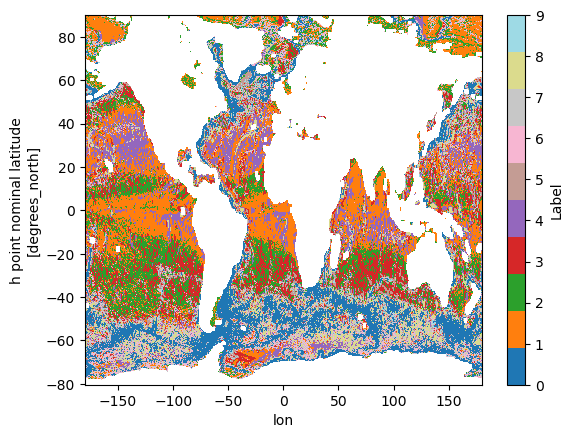

In [21]:
mom6_labels.plot(cmap=plt.get_cmap('tab20',numberOfClustersToAssess))
plt.show()

In [22]:
mom6_labels.to_netcdf(f'Data_Step2/mom6_labels_{numberOfClustersToAssess}_clusters.nc')